# FineST in CRC Visium HD data

## Main steps

- Step1: Prepare paired image patch and ST spot: Align image pixels with bin coordinates
- Step2: Train the model on 80% data and test on 20% data, on 16um-bin Visium HD dataset
- Step3: Infer sub-bin gene expression using trained model and impute using measured bins

In [1]:
import os
import time
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import torch
import scanpy as sc
import logging
from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import json
print(torch.__version__)

# import FineST as fst
# from FineST.datasets import dataset
# import FineST.plottings as fstplt
# print("FineST version: %s" %fst.__version__)

2.4.1+cu121


If use the local FineST packages

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
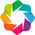

In [2]:
## From GPU2
path = '/mnt/lingyu/nfs_share2/Python/'
os.chdir(str(path) + 'FineST/FineST/')
import FineST as fst
from FineST.datasets import dataset
import FineST.plottings as fstplt

In [3]:
path = '/mnt/lingyu/nfs_share2/Python/'

fst.setup_seed(666)

if torch.cuda.is_available():
    dev = "cuda:1"
else:
    dev = "cpu"
device = torch.device(dev)

colors = ["#000003",  "#3b0f6f",  "#8c2980",   "#f66e5b", "#fd9f6c", "#fbfcbf"]
cnt_color = clr.LinearSegmentedColormap.from_list('magma', colors, N=256)

In [5]:
logging.getLogger().setLevel(logging.INFO)

model_folder = str(path) + 'FineST/FineST_local/Finetune/'
dir_name = model_folder + datetime.now().strftime('%Y%m%d%H%M%S%f')
if not os.path.exists(dir_name):
    os.makedirs(dir_name)
    logger = fst.setup_logger(dir_name)

print(dir_name)

/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Finetune/20250226104612852832


Load parameters

In [8]:
parameter_file_path = str(path) + 'FineST/FineST_local/Parameter/parameters_CRC16_0103_virchow2.json'
with open(parameter_file_path,"r") as json_file:
    params = json.load(json_file)

logger.info("Load parameters:\n" + json.dumps(params, indent=2))

[2025-02-11 22:09:30] INFO - Load parameters:
{
  "n_encoder_hidden_matrix": 256,
  "n_encoder_hidden_image": 128,
  "n_encoder_latent": 128,
  "n_projection_hidden": 256,
  "n_projection_output": 128,
  "batch_size": 200,
  "batch_size_pair": 640,
  "n_encoder_layers": 2,
  "dropout_rate": 0,
  "training_epoch": 50,
  "inital_learning_rate": 0.25,
  "k_nearest_positives": 0,
  "temperature": 0.03,
  "n_input_image": 1280,
  "w1": 0,
  "w2": 0,
  "w3": 1,
  "w4": 1
}


## 1. Load Spatial and Image data

1.1 Load spatial data

In [6]:
adata = dataset.CRC16um()
print(adata)

AnnData object with n_obs × n_vars = 137051 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [19]:
# adata_count = adata.copy()
# adata = fst.adata_preprocess(adata_count, keep_raw=True, normalize=True, n_top_genes=1000)
# print(adata)
# # hvg_df = adata.var[adata.var['highly_variable']].copy()
# hvg_df = pd.DataFrame(adata.var_names[adata.var['highly_variable']])
# hvg_df
# ## save
# hvg_df.to_csv('/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Dataset/ImputData/CRC16um/HVG_genes_16um.csv', index=False, header=None)

1.2 Selected LR genes 

In [10]:
LR_gene_path = str(path)+'FineST/FineST/Dataset/LRgene/LRgene_CellChatDB_baseline.csv'
adata = fst.adata_LR(adata, LR_gene_path)
adata

AnnData object with n_obs × n_vars = 137051 × 864
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

1.3 Data preprocess

In [11]:
adata_count = adata.copy()
adata = fst.adata_preprocess(adata_count, keep_raw=True, normalize=False)
print(adata)

gene_hv = np.array(adata.var_names)
print("gene_hv length:", len(gene_hv))
matrix = fst.adata2matrix(adata, gene_hv)
matrix

AnnData object with n_obs × n_vars = 137051 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'
gene_hv length: 862
(137051, 862)


,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
,,,,,,,,,,,,,,,,,,,,,
s_016um_00052_00082-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00010_00367-1,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00163_00399-1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
s_016um_00238_00388-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00144_00175-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00375_00231-1,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00109_00223-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00039_00175-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


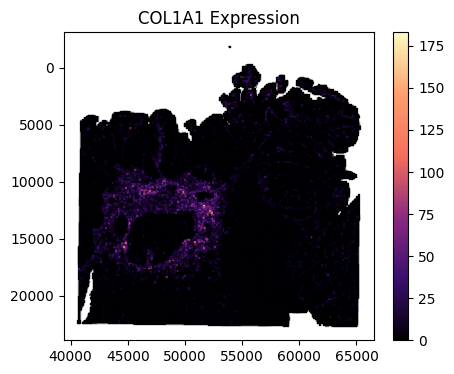

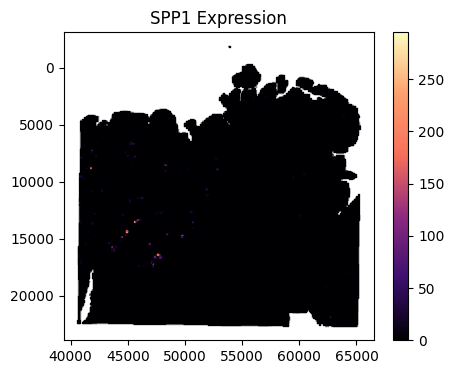

In [12]:
fstplt.gene_expr(adata_count, adata_count.to_df(), gene_selet='COL1A1', marker='s', s=0.1, figsize=(5, 4), save_path=None)
fstplt.gene_expr(adata_count, adata_count.to_df(), gene_selet='SPP1', marker='s', s=0.1, figsize=(5, 4), save_path=None)

1.4 Order by image file name

In [13]:
## Load image embedding from HIPT
file_paths = sorted(os.listdir(str(path) + 'FineST/FineST_local/Dataset/CRC16um/HIPT/HD_CRC_16um_pth_28_14'))
print("Image embedding file:", file_paths[:3])

Image embedding file: ['HD_CRC_16um_40624.27653892974_22352.72327885696.pth', 'HD_CRC_16um_40625.065571800296_22294.29475902266.pth', 'HD_CRC_16um_40625.85460213809_22235.866426741108.pth']


In [14]:
df = fst.get_image_coord(file_paths, dataset_class="VisiumHD")
print(df.shape)
print(df.head())

(136954, 2)
              pixel_x             pixel_y
0   22352.72327885696   40624.27653892974
1   22294.29475902266  40625.065571800296
2  22235.866426741108   40625.85460213809
3  22177.438282011397   40626.64362994314
4   22119.01032483262   40627.43265521545


In [15]:
## Read ST bin position in '.parquet' format
patientxy = 'CRC16um'
position_path = str(path)+'FineST/FineST_local/Dataset/'+str(patientxy)+'/square_016um/'
position_name = 'tissue_positions.parquet'
position_tissue = fst.parquet2csv(position_path, position_name)
position_tissue

,in_tissue,array_row,array_col,pxl_col_in_fullres,pxl_row_in_fullres
barcode,,,,,
s_016um_00000_00000-1,1,0,0,22352.723279,40624.276539
s_016um_00000_00001-1,1,0,1,22353.507390,40682.662627
s_016um_00000_00002-1,1,0,2,22354.291503,40741.048834
s_016um_00000_00003-1,1,0,3,22355.075617,40799.435159
s_016um_00000_00007-1,1,0,7,22358.212091,41032.981648
...,...,...,...,...,...
s_016um_00391_00254-1,1,391,254,-285.338795,55757.250510
s_016um_00391_00255-1,1,391,255,-284.577975,55815.630416
s_016um_00418_00220-1,1,418,220,-1887.091347,53793.129171


In [16]:
## save .csv file
position_tissue.to_csv("tissue_positions_"+str(patientxy)+".csv") 

In [17]:
## Load ST bin position '.csv' format
patientxy = 'CRC16um'
os.chdir(str(path)+'FineST/FineST_local/Dataset/'+str(patientxy)+'/square_016um/')
position = pd.read_csv("tissue_positions_"+str(patientxy)+".csv")
position

,barcode,in_tissue,array_row,array_col,pxl_col_in_fullres,pxl_row_in_fullres
0,s_016um_00000_00000-1,1,0,0,22352.723279,40624.276539
1,s_016um_00000_00001-1,1,0,1,22353.507390,40682.662627
2,s_016um_00000_00002-1,1,0,2,22354.291503,40741.048834
3,s_016um_00000_00003-1,1,0,3,22355.075617,40799.435159
4,s_016um_00000_00007-1,1,0,7,22358.212091,41032.981648
...,...,...,...,...,...,...
137046,s_016um_00391_00254-1,1,391,254,-285.338795,55757.250510
137047,s_016um_00391_00255-1,1,391,255,-284.577975,55815.630416
137048,s_016um_00418_00220-1,1,418,220,-1887.091347,53793.129171
137049,s_016um_00418_00221-1,1,418,221,-1886.332213,53851.502537


In [18]:
## merge position
position_image = fst.image_coord_merge(df, position, dataset_class='VisiumHD')
spotID_order = np.array(position_image['barcode'])
print(position_image.shape)
print(position_image.head())

(136954, 6)
                 barcode  in_tissue  x  y       pixel_x       pixel_y
0  s_016um_00000_00000-1          1  0  0  22352.723279  40624.276539
1  s_016um_00001_00000-1          1  1  0  22294.294759  40625.065572
2  s_016um_00002_00000-1          1  2  0  22235.866427  40625.854602
3  s_016um_00003_00000-1          1  3  0  22177.438282  40626.643630
4  s_016um_00004_00000-1          1  4  0  22119.010325  40627.432655


1.5 Order matrix row/barcode, spatial coordinates by image coordinates

In [19]:
matrix_order, matrix_order_df = fst.sort_matrix(matrix, position_image, spotID_order, gene_hv)
matrix_order_df

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_016um_00000_00000-1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
s_016um_00001_00000-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
s_016um_00002_00000-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00003_00000-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00004_00000-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00298_00418-1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00299_00418-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00300_00418-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_016um_00301_00418-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
## save gene expression mateix
np.save(str(path)+'FineST/FineST_local/Dataset/CRC16um/ContrastCRC16geneLR/harmony_matrix.npy', matrix_order_df.T)

In [21]:
position_order = fst.update_st_coord(position_image)
position_order

,pixel_y,pixel_x,array_row,array_col
0,40624.276539,22352.723279,0,0
1,40625.065572,22294.294759,0,1
2,40625.854602,22235.866427,0,2
3,40626.643630,22177.438282,0,3
4,40627.432655,22119.010325,0,4
...,...,...,...,...
136949,65263.452752,5269.666946,418,298
136950,65264.202199,5211.268963,418,299
136951,65264.951645,5152.871167,418,300
136952,65265.701087,5094.473559,418,301


In [22]:
## save the position data  -- train model used
position_order.to_csv(str(path)+"FineST/FineST_local/Dataset/CRC16um/ContrastCRC16geneLR/position_order.csv", index=False, header=False)

In [23]:
####################################################
# Different: 
# HD data need to match the image coords
# adata_redu, matrix_order_df,  for update_adata()
####################################################
adata = fst.update_adata_coord(adata, matrix_order_df, position_image, spotID_order, gene_hv, dataset_class='VisiumHD')
print(adata)
print(adata.obsm['spatial'])

AnnData object with n_obs × n_vars = 136954 × 862
    obs: 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'
[[40624.276539 22352.723279]
 [40625.065572 22294.294759]
 [40625.854602 22235.866427]
 ...
 [65264.951645  5152.871167]
 [65265.701087  5094.473559]
 [65266.450528  5036.076139]]


In [24]:
## adata - normalized
adata_count = adata.copy()
adata_norma = fst.adata_preprocess(adata_count, keep_raw=True, normalize=True)
print(adata_norma)
adata_norma.to_df().head()

AnnData object with n_obs × n_vars = 136954 × 862
    obs: 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'


,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_016um_00000_00000-1,0.0,0.0,1.341843,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.341843,0.0,0.0,0.0,1.341843,0.0,0.000000,0.0
s_016um_00001_00000-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,1.528469,0.0
s_016um_00002_00000-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0
s_016um_00003_00000-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0
s_016um_00004_00000-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0


In [25]:
## save the original adata
patientxy = 'CRC16um'
adata_count.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_count.h5ad')
adata_norma.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_norma.h5ad')

## 2 Train and Test model

2.1 Data loader and splitting: 80% for train and 20% for test

In [28]:
spatial_pos_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/ContrastCRC16geneLR/position_order.csv'
reduced_mtx_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/ContrastCRC16geneLR/harmony_matrix.npy'  
image_embed_path_CRC16=str(path) + 'FineST/FineST_local/Dataset/CRC16um/HIPT/HD_CRC_16um_pth_28_14/*.pth'

2.2 Train and test model on 80% Viisum HD data with 16um

In [29]:
# ## load parameter settings
# with open(parameter_file_path,"r") as json_file:
#     params = json.load(json_file)

# ## add params
# params['n_input_matrix'] = len(gene_hv)

# ## init the model
# model = fst.FineSTModel(n_input_matrix=params['n_input_matrix'],
#                               n_input_image=params['n_input_image'],
#                               n_encoder_hidden_matrix=params["n_encoder_hidden_matrix"],
#                               n_encoder_hidden_image=params["n_encoder_hidden_image"],
#                               n_encoder_latent=params["n_encoder_latent"],
#                               n_projection_hidden=params["n_projection_hidden"],
#                               n_projection_output=params["n_projection_output"],
#                               n_encoder_layers=params["n_encoder_layers"]).to(device) 
# # l = fst.ContrastiveLoss(temperature=params['temperature'])
# l = fst.ContrastiveLoss(temperature=params['temperature'], 
#                         w1=params['w1'], w2=params['w2'], w3=params['w3'], w4=params['w4'])
# # print(model)

# ## Set optimizer
# optimizer = torch.optim.SGD(model.parameters(), lr=params['inital_learning_rate'], momentum=0.9, weight_decay=5e-4)

# ## Load the data
# train_loader, test_loader = fst.build_loaders(batch_size=params['batch_size'], 
#                                               image_embed_path=image_embed_path_CRC16, 
#                                               spatial_pos_path=spatial_pos_path, 
#                                               reduced_mtx_path=reduced_mtx_path, 
#                                               dataset_class='VisiumHD')


# # Train the model for a fixed number of epoch
# logger.info('Begin Training ...')

# start_train_time = time.time()

# best_loss = float('inf')
# best_epoch = 0

# # Initialize lists to store losses
# train_losses = []
# test_losses = []

# for epoch in range(params['training_epoch']):
#     logger.info('epoch [{}/{}]'.format(epoch + 1, epoch))
#     print(f"Epoch: {epoch + 1}")
    
#     ######################################################################################
#     # Train the model 
#     ######################################################################################
#     model.train()
    
#     start_time = time.time()
#     train_loss = fst.train_model(params, model, train_loader, optimizer, epoch, l, 
#                                  tree_type='KDTree', leaf_size=2, dataset_class='VisiumHD')    # LOSS
#     # Append training loss
#     train_losses.append(train_loss)
    
#     print("--- %s seconds ---" % (time.time() - start_time))
    
#     ######################################################################################
#     # Evaluate the model 
#     ######################################################################################
#     model.eval()
#     with torch.no_grad():
#         test_loss = fst.test_model(params, model, test_loader, l, 
#                                 tree_type='KDTree', leaf_size=2, dataset_class='VisiumHD') 
#         # Append test loss
#         test_losses.append(test_loss)
    
#     if best_loss > test_loss:
#         best_loss = test_loss
#         best_epoch = epoch

#         fst.save_model(model, dir_name, params, optimizer, train_loss)
#         # torch.save(model.state_dict(), "STFinetune/best.pt")    # BLEEP
#         print("Saved Best epoch & Best Model! Loss: [{}: {}]".format(best_epoch, best_loss))
#         logger.info("Saved Best epoch & Best Model! Loss: [{}: {}]".format(best_epoch, best_loss))

# print("Done!, final loss: {}".format(best_loss))
# print("Best epoch: {}".format(best_epoch))

# print("--- %s seconds ---" % (time.time() - start_train_time))

# logger.info("Done!, Best epoch & Best Model! Loss: [{}: {}]".format(best_epoch, best_loss))

# logger.info('Finished Training')

In [32]:
# fst.loss_curve(train_losses, test_losses, best_epoch, best_loss, max_step=5, min_step=1, 
               # fig_size=(5, 4), format='svg', save_path=str(path)+'FineST/FineST_local/Dataset/NPC/CRC16um/CRC16um_loss_curve.svg')

## 3. Inference sub-bins using trained model, Imputation using measured bin data, and Evaluation bin or sub-bin level prediction

3.1 Inference: within spot

In [33]:
dir_name = '/mnt/lingyu/nfs_share2/Python/FineST/FineST_local/Finetune/20250118002610915290'  

In [34]:
# load models
model = fst.load_model(dir_name, parameter_file_path, params, gene_hv) 

## load all data
test_loader = fst.build_loaders_inference(batch_size=adata.shape[0], 
                                          image_embed_path=image_embed_path_CRC16, 
                                          spatial_pos_path=spatial_pos_path, 
                                          reduced_mtx_path=reduced_mtx_path,
                                          image_clacss='Virchow2',
                                          dataset_class='VisiumHD')

## inference
(matrix_profile,
 reconstructed_matrix, 
 recon_ref_adata_image_f2, 
 reconstructed_matrix_reshaped, 
 input_coord_all) = fst.infer_model_fst(model, test_loader, logger,  dataset_class='VisiumHD')

[2025-02-11 22:15:05] INFO - Running inference task...


Finished loading all files
***** Finished building loaders_inference *****
device cuda:0
***** Begin perform_inference: ******


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  8.63s/it]


***** batch_size=adata.shape[0] doen't effect *****
torch.Size([136954, 862])
torch.Size([136954, 4, 1280])
1
1
1
***** *****
Finished extractting test data


[2025-02-11 22:15:18] INFO - Running inference task DONE!


--- 13.668843746185303 seconds for inference within spots ---
Reconstructed_matrix_reshaped shape:  torch.Size([547816, 862])


In [35]:
print(matrix_profile)
print(reconstructed_matrix)
print(recon_ref_adata_image_f2)
print(input_coord_all)

[[0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0.00925987 0.00803206 0.17363852 ... 0.00888732 0.00898638 0.00462607]
 [0.0099888  0.03953492 0.00925735 ... 0.00873889 0.19424146 0.00433221]
 [0.00939984 0.00988887 0.00990516 ... 0.00967409 0.0094926  0.0050167 ]
 ...
 [0.00978525 0.0099331  0.0097094  ... 0.00939984 0.00973868 0.0047607 ]
 [0.00968326 0.00964362 0.00992689 ... 0.0094893  0.00967141 0.00490296]
 [0.00967296 0.0097213  0.00991882 ... 0.00964112 0.00949286 0.00502368]]
[[0.0128797  0.01567227 0.14275077 ... 0.01149523 0.00960779 0.00799589]
 [0.03278081 0.02451305 0.19937184 ... 0.03023584 0.03390859 0.00806437]
 [0.00919552 0.028011   0.05531123 ... 0.00832175 0.01322148 0.00764464]
 ...
 [0.00782416 0.03559921 0.09381936 ... 0.00531417 0.00728575 0.00614007]
 [0.00807418 0.03328045 0.09675699 ... 0.00575264 0.00751859 0.00646378]
 [0.00799795 0.03475698 0.1049

3.2 Get coordinates of sub-bins (8 um bins) from 16 um bins

In [36]:
reconstructed_matrix_reshaped_tensor, _ = fst.reshape_latent_image(reconstructed_matrix_reshaped,
                                                                   dataset_class='VisiumHD')
print(reconstructed_matrix_reshaped_tensor.shape)

torch.Size([136954, 4, 862])


In [37]:
print(adata.obsm['spatial'])    # width*hight (x,y)
print(adata.obsm['spatial'][:,0].max(), adata.obsm['spatial'][:,1].max())

[[40624.276539 22352.723279]
 [40625.065572 22294.294759]
 [40625.854602 22235.866427]
 ...
 [65264.951645  5152.871167]
 [65265.701087  5094.473559]
 [65266.450528  5036.076139]]
65266.450528 22680.620735


In [38]:
patch_size_x = fst.patch_size(adata, p=16, dir='x')
patch_size_y = fst.patch_size(adata, p=16, dir='y')
print(patch_size_x)
print(patch_size_y)

77129    58.378922
77513    58.379039
77897    58.379159
78283    58.379277
78669    58.379396
79055    58.379514
79441    58.379633
79826    58.379752
80211    58.379870
80595    58.379989
80980    58.380108
81365    58.380226
81749    58.380345
82134    58.380463
82518    58.380582
Name: 0, dtype: float64
1     58.428520
2     58.428332
3     58.428145
4     58.427957
5     58.427770
6     58.427582
7     58.427394
8     58.427207
9     58.427020
10    58.426832
11    58.426644
12    58.426457
13    58.426269
14    58.426082
15    58.425894
Name: 1, dtype: float64


In [39]:
scale_factors = fst.json_load(f"{path}/FineST/FineST_local/Dataset/CRC16um/square_016um/")
print(scale_factors['spot_diameter_fullres'])

58.417196833905315


In [40]:
## plot the sub-spot level gene expression of the first gene in the first within spot
(first_spot_first_variable, C,
 _, _, _) = fst.subspot_coord_expr_adata(reconstructed_matrix_reshaped_tensor,
                                         # adata, gene_hv, p=0, q=0, patch_size=scale_factors['spot_diameter_fullres'], dataset_class="VisiumHD")
                                         adata, gene_hv, p=0, q=0, patch_size=56, dataset_class="VisiumHD")
print("first_spot_first_variable shape:", first_spot_first_variable.shape)

pixel_step (half of patch_size): 14.0
first_spot_first_variable shape: (4,)


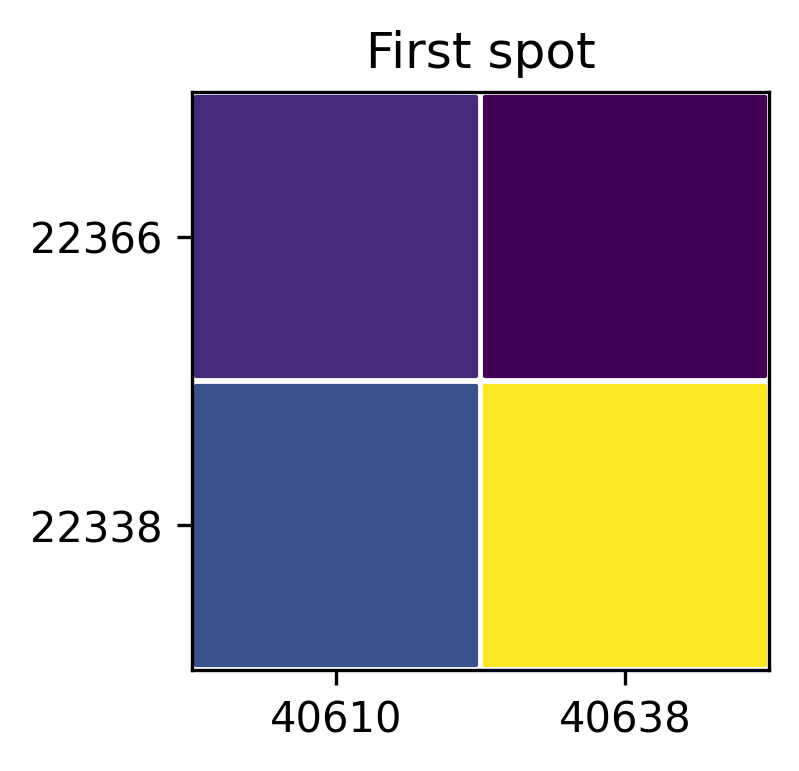

In [42]:
fstplt.subspot_expr(C, first_spot_first_variable, patch_size=56, dataset_class='VisiumHD', 
                    marker='s', s=4500, fig_size=(2.5, 2.5), format='svg', 
                    save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/NPC_spot_splitting.svg')

In [43]:
## Get the sub-spot level gene expression of all genes in all within spots
(_, _, all_spot_all_variable,
 C2, adata_infer) = fst.subspot_coord_expr_adata(reconstructed_matrix_reshaped_tensor,
                                                # adata, gene_hv, patch_size=scale_factors['spot_diameter_fullres'], dataset_class="VisiumHD")
                                                adata, gene_hv, patch_size=56, dataset_class="VisiumHD")
print("all_spot_all_variable shape:", all_spot_all_variable.shape)
print(adata_infer)

pixel_step (half of patch_size): 14.0
all_spot_all_variable shape: (547816, 862)
AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    obsm: 'spatial'


In [44]:
print(adata_infer.obs[['x', 'y']])
print(adata_infer.obsm['spatial'])
print(adata_infer.obsm['spatial'][:,0].max(), adata_infer.obsm['spatial'][:,1].max())

            x      y
0       40610  22338
1       40638  22338
2       40610  22366
3       40638  22366
4       40611  22280
...       ...    ...
547811  65279   5108
547812  65252   5022
547813  65280   5022
547814  65252   5050
547815  65280   5050

[547816 rows x 2 columns]
[[40610 22338]
 [40638 22338]
 [40610 22366]
 ...
 [65280  5022]
 [65252  5050]
 [65280  5050]]
65280 22694


**3.3 Test the infer data**

In [45]:
_, adata_infer_reshape = fst.reshape_latent_image(torch.tensor(adata_infer.X), dataset_class='VisiumHD')
print("adata_infer shape:", adata_infer.shape)
print("adata_infer_reshape shape:", adata_infer_reshape.shape)

adata_infer shape: (547816, 862)
adata_infer_reshape shape: torch.Size([136954, 862])


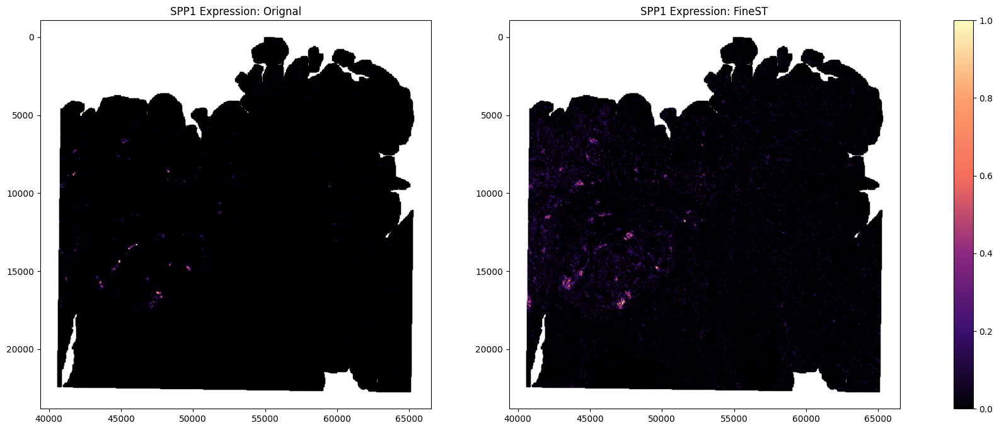

In [46]:
fstplt.gene_expr_compare(adata, "SPP1", adata_infer_reshape, gene_hv, marker='s', save_path=None)

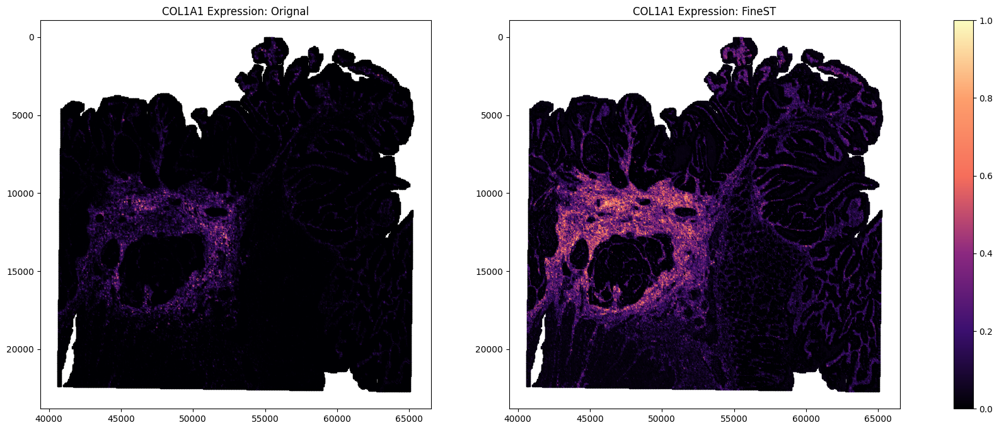

In [47]:
fstplt.gene_expr_compare(adata, "COL1A1", adata_infer_reshape, gene_hv, marker='s', save_path=None)

In [49]:
(pearson_cor_gene,
 spearman_cor_gene,
 cosine_sim_gene) = fst.mean_cor(adata, adata_infer_reshape, 'reconf2', sample="gene")

matrix1:  (136954, 862)
matrix2:  (136954, 862)
Mean Pearson correlation coefficient--reconf2: 0.1683
Mean Spearman correlation coefficient--reconf2: 0.1393
Mean cosine similarity--reconf2: 0.2122


0.6454702101512958
0.16833441690648915


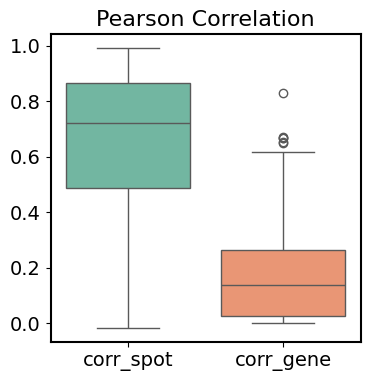

In [51]:
fstplt.mean_cor_box(adata, adata_infer_reshape, 
                    save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Boxplot_infer_cor_count_16um.pdf')

In [52]:
adata_df_infer = fst.reshape2adata(adata, adata_infer_reshape, gene_hv)
adata_df_infer.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_016um_00000_00000-1,0.012880,0.015672,0.142751,0.009413,0.021341,0.009424,0.008571,0.009908,0.009076,0.009667,...,0.009001,0.009300,0.011698,0.009352,0.009395,0.009302,0.020650,0.011495,0.009608,0.007996
s_016um_00001_00000-1,0.032781,0.024513,0.199372,0.009309,0.024808,0.009610,0.008806,0.011855,0.015858,0.011274,...,0.009072,0.017090,0.046505,0.018961,0.009734,0.009449,0.015768,0.030236,0.033909,0.008064
s_016um_00002_00000-1,0.009196,0.028011,0.055311,0.008895,0.008888,0.009664,0.008585,0.009820,0.008557,0.009636,...,0.007686,0.009016,0.008725,0.008914,0.009172,0.008079,0.014391,0.008322,0.013221,0.007645
s_016um_00003_00000-1,0.008792,0.042593,0.110991,0.008393,0.007780,0.022945,0.008195,0.010483,0.008228,0.010066,...,0.006409,0.008816,0.007873,0.008495,0.008537,0.006693,0.017781,0.007332,0.008450,0.007534
s_016um_00004_00000-1,0.008997,0.025227,0.060002,0.008802,0.008626,0.009660,0.008314,0.009787,0.008250,0.009957,...,0.007102,0.008848,0.008483,0.008713,0.009034,0.007481,0.015144,0.008029,0.008898,0.007497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00298_00418-1,0.007824,0.035599,0.093819,0.007410,0.006489,0.009392,0.006841,0.009598,0.006659,0.009308,...,0.004302,0.007764,0.006476,0.007029,0.007600,0.004428,0.008798,0.005314,0.007286,0.006140
s_016um_00299_00418-1,0.007824,0.035599,0.093819,0.007410,0.006489,0.009392,0.006841,0.009598,0.006659,0.009308,...,0.004302,0.007764,0.006476,0.007029,0.007600,0.004428,0.008798,0.005314,0.007286,0.006140
s_016um_00300_00418-1,0.007824,0.035599,0.093819,0.007410,0.006489,0.009392,0.006841,0.009598,0.006659,0.009308,...,0.004302,0.007764,0.006476,0.007029,0.007600,0.004428,0.008798,0.005314,0.007286,0.006140
s_016um_00301_00418-1,0.008074,0.033280,0.096757,0.007671,0.006846,0.009510,0.007155,0.009640,0.006953,0.009357,...,0.004794,0.007992,0.006832,0.007363,0.007891,0.004901,0.008960,0.005753,0.007519,0.006464


0.16833441690648918


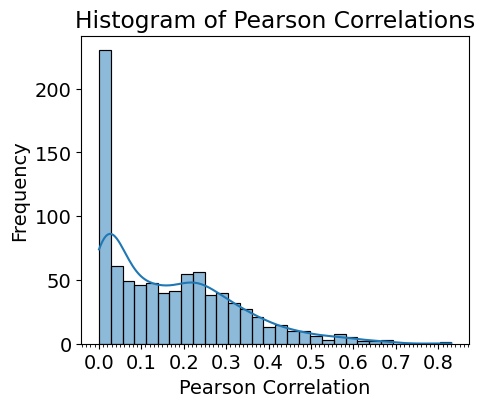

In [53]:
# cost to much time
fstplt.cor_hist(adata, adata_df_infer.to_df(), 
                 fig_size=(5, 4), trans=False, format='svg', 
                 save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Hist_infer_cor_count.svg')

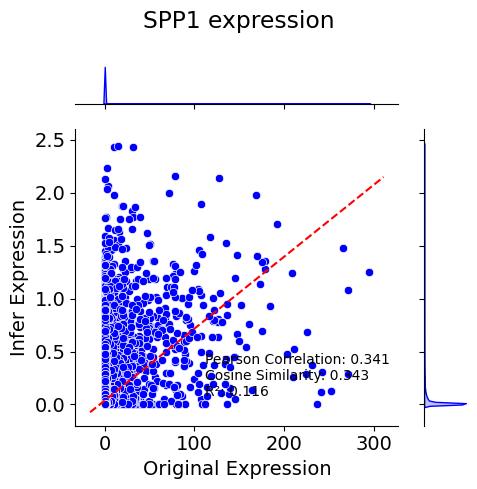

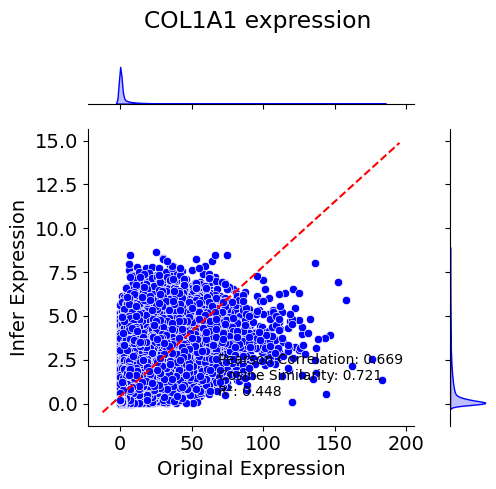

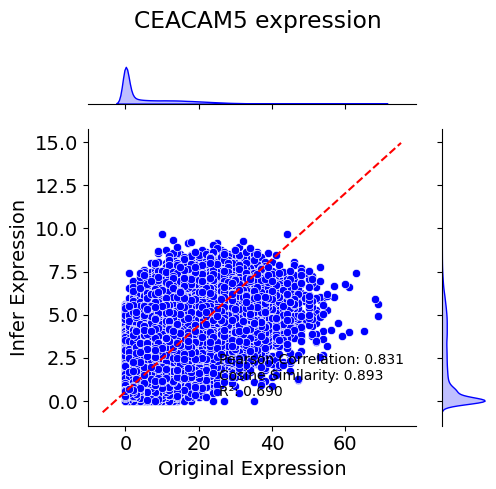

In [54]:
fstplt.sele_gene_cor(adata, adata_infer_reshape, gene_hv, gene = "SPP1",
                     ylabel='Infer Expression', title = "SPP1 expression", size=5,
                     save_path=None)
fstplt.sele_gene_cor(adata, adata_infer_reshape, gene_hv, gene = "COL1A1",
                     ylabel='Infer Expression', title = "COL1A1 expression", size=5,
                     save_path=None)
fstplt.sele_gene_cor(adata, adata_infer_reshape, gene_hv, gene = "CEACAM5",
                     ylabel='Infer Expression', title = "CEACAM5 expression", size=5,
                     save_path=None)

In [55]:
print(adata_infer)
print(adata_df_infer)

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 136954 × 862
    obs: 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'


In [56]:
# save adata: 08um infer
patientxy = 'CRC16um'
adata_infer.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_infer_8um.h5ad')

In [57]:
# save adata: 08um infer
patientxy = 'CRC16um'
adata_df_infer.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_infer_16um.h5ad')

## 16um: Smooth

Only use imputation

In [58]:
adata_smooth = fst.impute_adata(adata, adata_infer, C2, gene_hv, 
                               dataset_class='VisiumHD', weight_exponent=2)
print(adata_smooth)

--- 2064.429785013199 seconds ---
AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'


In [59]:
adata_smooth, data_smooth = fst.weight_adata(adata_infer, adata_smooth, gene_hv, w=0.0)
print(data_smooth)
print(adata_smooth)

tensor([[0.0000, 0.0000, 0.7367,  ..., 0.0000, 0.1458, 0.0000],
        [0.0000, 0.0000, 0.6578,  ..., 0.0000, 0.1290, 0.0000],
        [0.0000, 0.0000, 0.8329,  ..., 0.0000, 0.0594, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       dtype=torch.float64)
AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


In [62]:
print(adata_smooth.obs[['x', 'y']])
print(adata_smooth.obsm['spatial'])
print(adata_smooth.obsm['spatial'][:,0].max(), adata_smooth.obsm['spatial'][:,1].max())

            x      y
0       40610  22338
1       40638  22338
2       40610  22366
3       40638  22366
4       40611  22280
...       ...    ...
547811  65279   5108
547812  65252   5022
547813  65280   5022
547814  65252   5050
547815  65280   5050

[547816 rows x 2 columns]
[[40610 22338]
 [40638 22338]
 [40610 22366]
 ...
 [65280  5022]
 [65252  5050]
 [65280  5050]]
65280 22694


In [63]:
adata_smooth.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
0,0.0,0.0,0.736669,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.793193,0.0,0.0,0.0,0.736669,0.0,0.145766,0.0
1,0.0,0.0,0.657795,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.777692,0.0,0.0,0.0,0.657795,0.0,0.128983,0.0
2,0.0,0.0,0.832852,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.891526,0.0,0.0,0.0,0.832852,0.0,0.059409,0.0
3,0.0,0.0,0.754284,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.882938,0.0,0.0,0.0,0.754284,0.0,0.052203,0.0
4,0.0,0.0,0.053986,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.082002,0.0,0.0,0.0,0.053986,0.0,0.728285,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
547811,0.0,0.0,0.000000,0.0,0.0,0.037346,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0
547812,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0
547813,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0
547814,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0


In [64]:
_, data_smooth_reshape = fst.reshape_latent_image(data_smooth, dataset_class='VisiumHD')
print("data_smooth shape:", data_smooth.shape)
print("data_smooth_reshape shape:", data_smooth_reshape.shape)

data_smooth shape: torch.Size([547816, 862])
data_smooth_reshape shape: torch.Size([136954, 862])


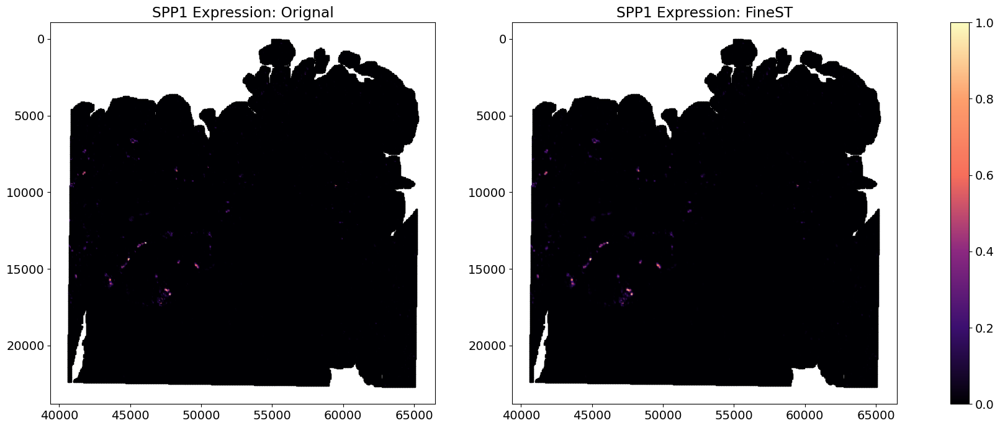

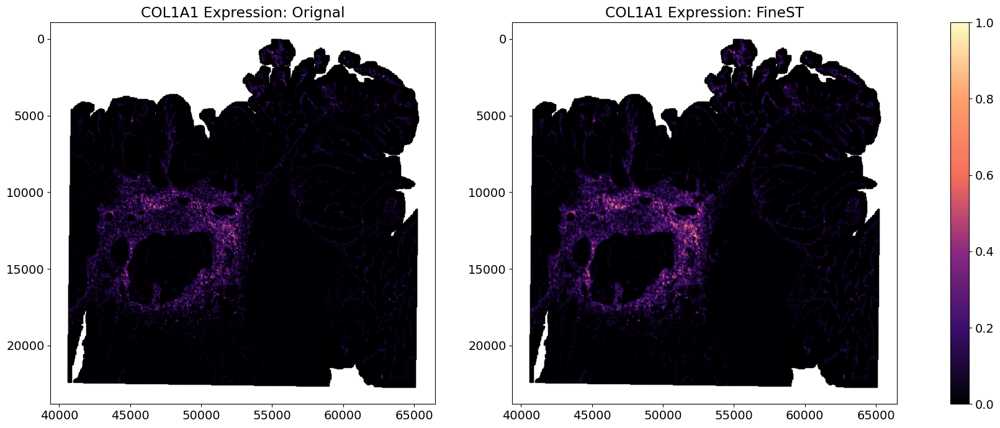

In [65]:
fstplt.gene_expr_compare(adata, "SPP1", data_smooth_reshape, gene_hv,  marker='s', save_path=None)
fstplt.gene_expr_compare(adata, "COL1A1", data_smooth_reshape, gene_hv,  marker='s', save_path=None)
# fstplt.gene_expr_compare(adata, "CEACAM5", data_smooth_reshape, gene_hv,  marker='s', save_path=None)

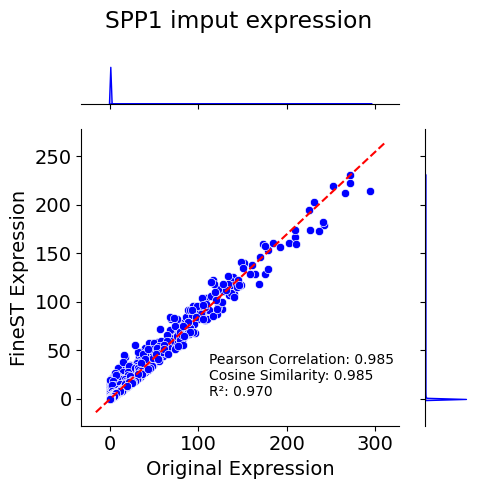

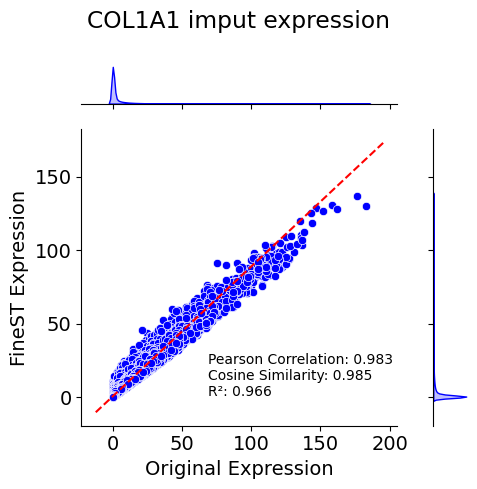

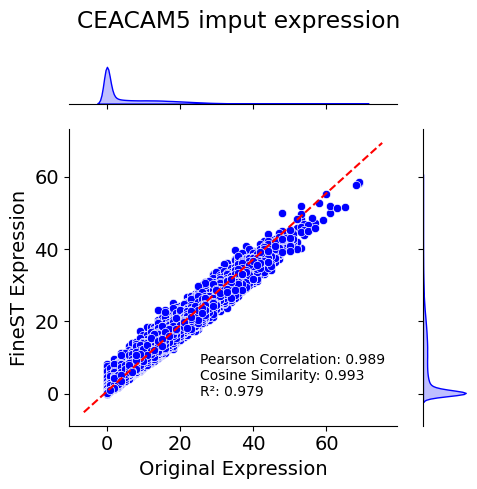

In [67]:
fstplt.sele_gene_cor(adata, data_smooth_reshape, gene_hv, gene = "SPP1",
                     ylabel='FineST Expression', title = "SPP1 imput expression", size=5,
                     save_path=None)
fstplt.sele_gene_cor(adata, data_smooth_reshape, gene_hv, gene = "COL1A1",
                     ylabel='FineST Expression', title = "COL1A1 imput expression", size=5,
                     save_path=None)
fstplt.sele_gene_cor(adata, data_smooth_reshape, gene_hv, gene = "CEACAM5",
                     ylabel='FineST Expression', title = "CEACAM5 imput expression", size=5,
                     save_path=None)

In [69]:
(pearson_cor_gene,
 spearman_cor_gene,
 cosine_sim_gene) = fst.mean_cor(adata, data_smooth_reshape, 'reconf2', sample="gene")

matrix1:  (136954, 862)
matrix2:  (136954, 862)
Mean Pearson correlation coefficient--reconf2: 0.9687
Mean Spearman correlation coefficient--reconf2: 0.5205
Mean cosine similarity--reconf2: 0.9685


0.9476428278932488
0.9687306081786812


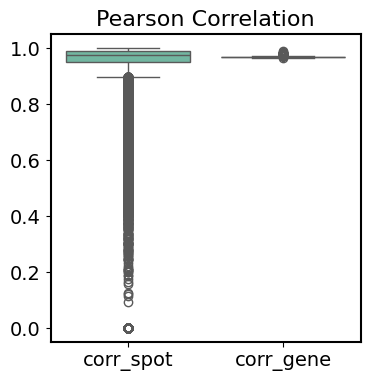

In [73]:
fstplt.mean_cor_box(adata, data_smooth_reshape, save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Boxplot_smooth_cor_count_16um.pdf')

## 08um: infer

Compare with CRC8um

In [74]:
adata_infer

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    obsm: 'spatial'

In [75]:
## Load 8um original data from VisiumHD 
adata_8um_raw = dataset.CRC08um()
print(adata_8um_raw)

AnnData object with n_obs × n_vars = 545913 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [76]:
# LR_gene_path = str(path)+'FineST/FineST/Dataset/LRgene/LRgene_CellChatDB_baseline.csv'
# adata_8um_raw = fst.adata_LR(adata_8um_raw, LR_gene_path)
# adata_8um = fst.adata_preprocess(adata_8um_raw, keep_raw=True)
# print(adata_8um)


## select the overlap genes
adata_8um_raw = adata_8um_raw[:, adata_infer.var_names]
adata_8um_raw

View of AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [77]:
adata_8um_raw.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_008um_00301_00321-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00526_00291-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00078_00444-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00128_00278-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00052_00559-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
s_008um_00384_00793-1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00565_00244-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00353_00477-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Smoth using for neighbours

In [78]:
# LR_gene_path = str(path)+'FineST/FineST/Dataset/LRgene/LRgene_CellChatDB_baseline.csv'

# adata_8um_raw = fst.adata_LR(adata_8um_raw, LR_gene_path)
# print(adata_8um_raw)
adata_8um = fst.adata_preprocess(adata_8um_raw, min_cells=1, normalize=False,  keep_raw=True)
print(adata_8um)

AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'


In [79]:
adata_8um.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_008um_00301_00321-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00526_00291-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00078_00444-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00128_00278-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00052_00559-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
s_008um_00384_00793-1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00565_00244-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
s_008um_00353_00477-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [80]:
## The predicted 8um data from FineST
adata_infer.obsm['spatial'] = np.stack([adata_infer.obs['x'], adata_infer.obs['y']], -1)
adata_infer.uns['spatial'] = adata_8um.uns['spatial']
print(adata_infer)

adata_infer_align, _, _ = fst.align_adata_fst2hd(adata_infer, adata_8um)
print(adata_infer_align)

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


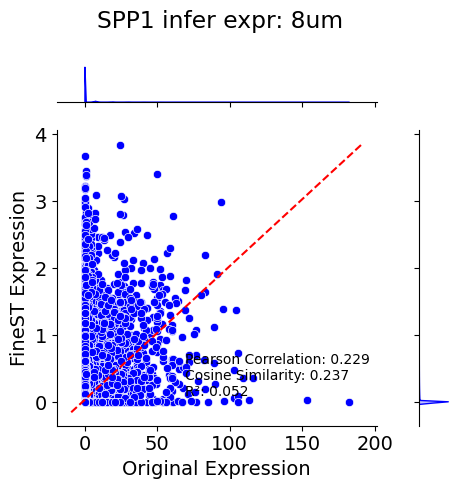

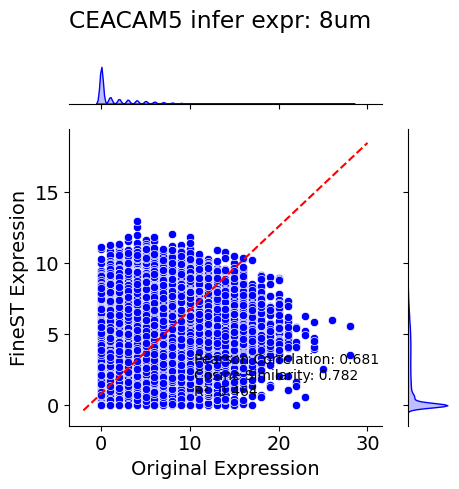

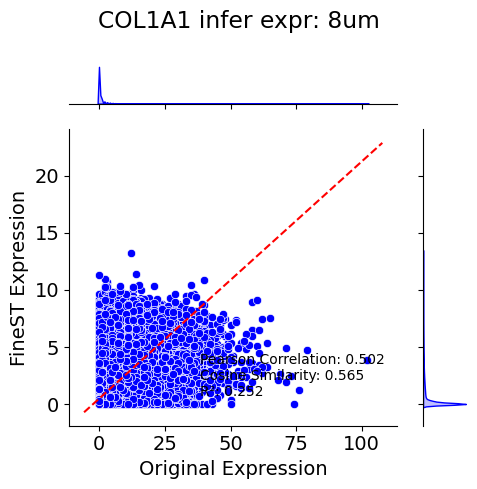

In [81]:
## Noemalized
fstplt.sele_gene_cor(adata_8um, adata_infer_align.to_df(), gene_hv, gene = "SPP1",
                     ylabel='FineST Expression', title = "SPP1 infer expr: 8um", size=5,
                     save_path=None)
fstplt.sele_gene_cor(adata_8um, adata_infer_align.to_df(), gene_hv, gene = "CEACAM5",
                     ylabel='FineST Expression', title = "CEACAM5 infer expr: 8um", size=5,
                     save_path=None)
fstplt.sele_gene_cor(adata_8um, adata_infer_align.to_df(), gene_hv, gene = "COL1A1",
                     ylabel='FineST Expression', title = "COL1A1 infer expr: 8um", size=5,
                     save_path=None)

0.423629755811641
0.08509824623214064


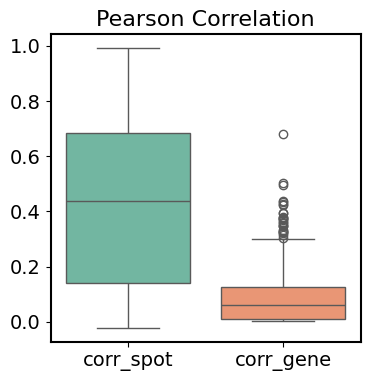

In [84]:
fstplt.mean_cor_box(adata_8um, np.array(adata_infer_align.to_df()), 
                    save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Boxplot_infer_cor_count_8um.pdf')

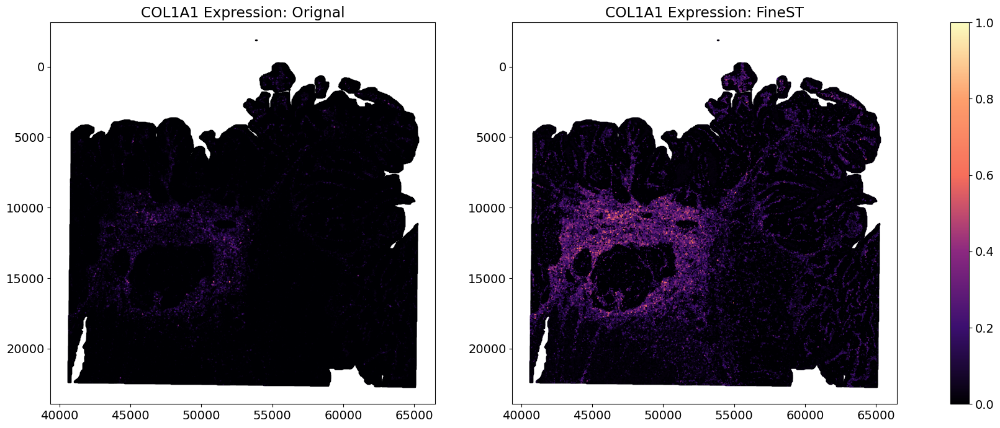

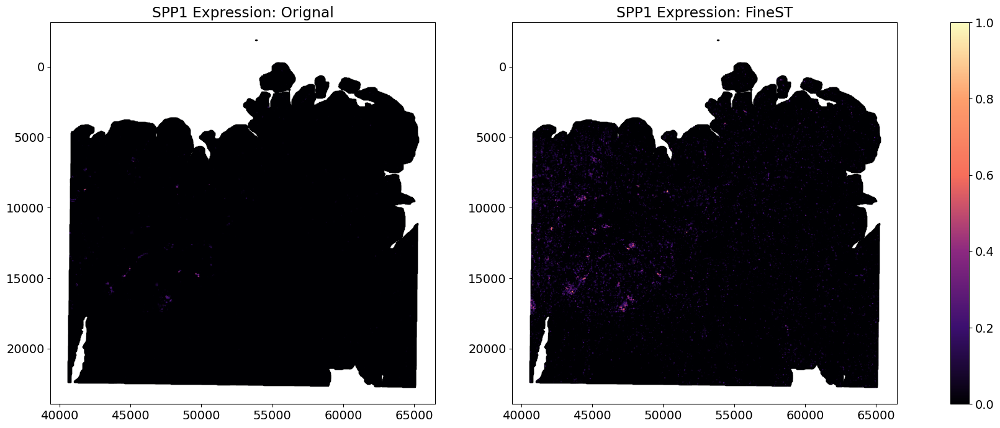

In [85]:
fstplt.gene_expr_compare(adata_8um, "COL1A1", adata_infer_align.X, gene_hv,
                      marker='s', s=0.5, save_path=None) 
fstplt.gene_expr_compare(adata_8um, "SPP1", adata_infer_align.X, gene_hv,
                      marker='s', s=0.5, save_path=None) 

## 08um: Smooth

3.5 Correlation on 8um: Selected gene、all spots and all genes、mean correlation box

In [92]:
adata_smooth

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'

In [93]:
## Load 8um original data from VisiumHD 
adata_8um_raw = dataset.CRC08um()
print(adata_8um_raw)

AnnData object with n_obs × n_vars = 545913 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


In [94]:
## select the overlap genes
adata_8um_raw = adata_8um_raw[:, adata_infer.var_names]
adata_8um_raw

View of AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [95]:
# ## Load 8um original data from VisiumHD 
# adata_8um = sc.read_h5ad(str(path)+'VisiumHD/Dataset/Colon_Cancer_square_008um.h5ad')
# adata_8um = adata_8um[:, adata.var_names]
# print(adata_8um)

# ## Data preprocess
# adata_8um = fst.adata_preprocess(adata_8um)
# print(adata_8um)

## The predicted 8um data from FineST
adata_smooth.obsm['spatial'] = np.stack([adata_smooth.obs['x'], adata_smooth.obs['y']], -1)
adata_smooth.uns['spatial'] = adata_8um.uns['spatial']
print(adata_smooth)

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


In [96]:
## Load 8um original data from VisiumHD 
adata_8um_raw = dataset.CRC08um()
print(adata_8um_raw)

## select the overlap genes
adata_8um_raw = adata_8um_raw[:, adata_infer.var_names]
adata_8um_raw

adata_8um = fst.adata_preprocess(adata_8um_raw, min_cells=1, normalize=False,  keep_raw=True)
print(adata_8um)

adata_smooth_align, _, _ = fst.align_adata_fst2hd(adata_smooth, adata_8um)
print(adata_smooth_align)

AnnData object with n_obs × n_vars = 545913 × 18085
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


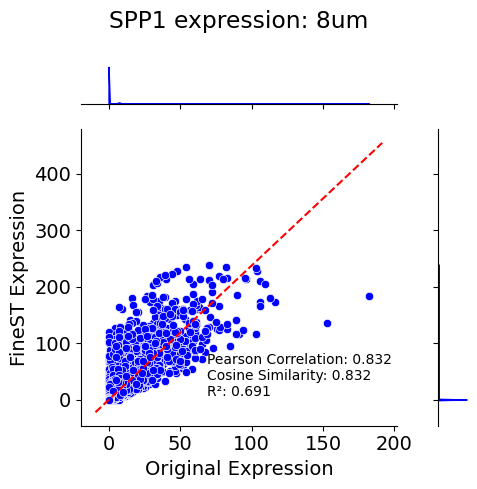

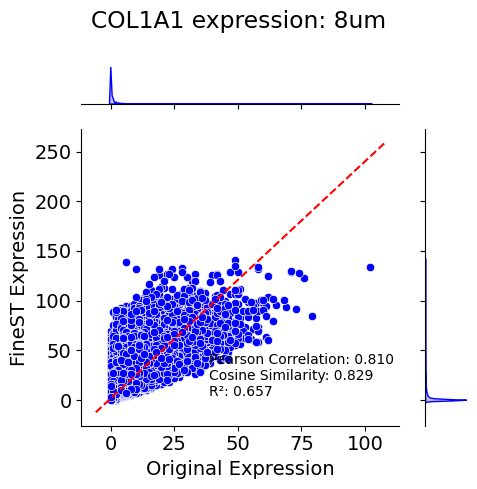

In [98]:
## Noemalized
fstplt.sele_gene_cor(adata_8um, adata_smooth_align.to_df(), gene_hv, gene = "SPP1",
                     ylabel='FineST Expression', title = "SPP1 expression: 8um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/SPP1_cor_smooth_8um.pdf') 
fstplt.sele_gene_cor(adata_8um, adata_smooth_align.to_df(), gene_hv, gene = "COL1A1",
                     ylabel='FineST Expression', title = "COL1A1 expression: 8um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/COL1A1_cor_smooth_8um.pdf') 

In [99]:
## Noemalized
logger.info("Running Gene Correlation task...")

(pearson_cor_gene,
 spearman_cor_gene,
 cosine_sim_gene) = fst.mean_cor(adata_8um, adata_smooth_align.to_df(), 'reconf2', sample="gene")

logger.info("Running Gene Correlation task DINE!")

[2025-02-11 23:11:48] INFO - Running Gene Correlation task...


matrix1:  (545913, 862)
matrix2:  (545913, 862)
Mean Pearson correlation coefficient--reconf2: 0.5152
Mean Spearman correlation coefficient--reconf2: 0.2701


[2025-02-11 23:13:23] INFO - Running Gene Correlation task DINE!


Mean cosine similarity--reconf2: 0.5218


0.611848709546896
0.5151528331780904


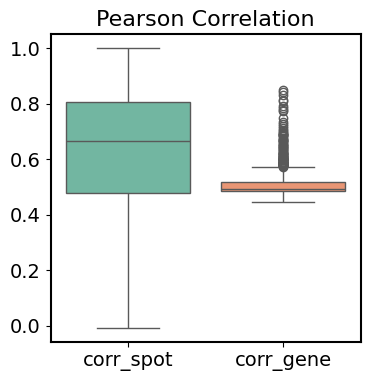

In [102]:
## Noemalized
fst.mean_cor_box(adata_8um, np.array(adata_smooth_align.to_df()), 
                 save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Boxplot_smooth_cor_count_8um.pdf')

In [103]:
print(adata_smooth_align)

AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


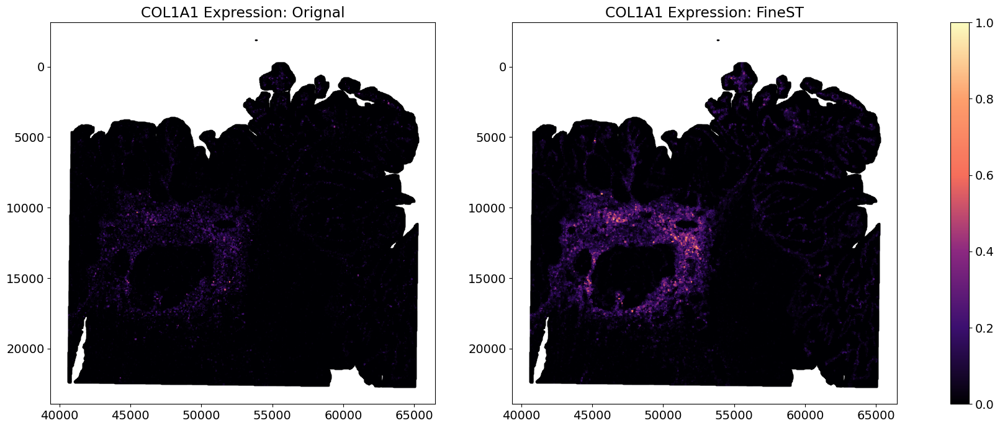

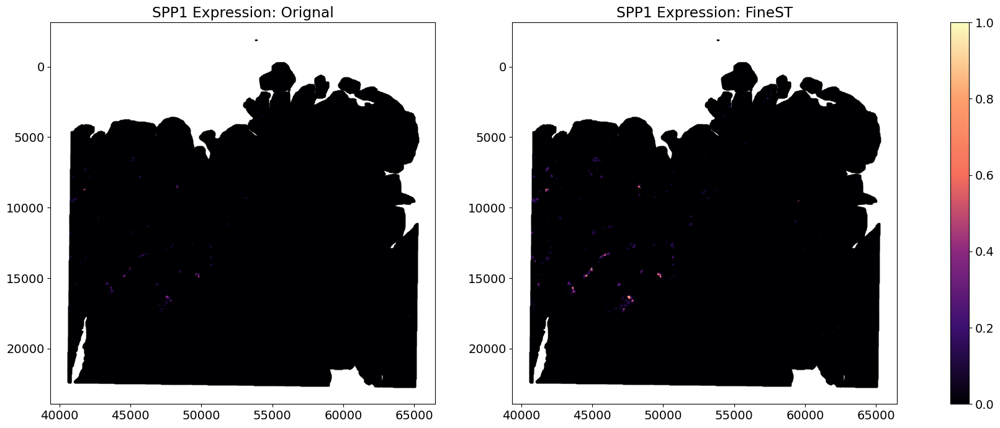

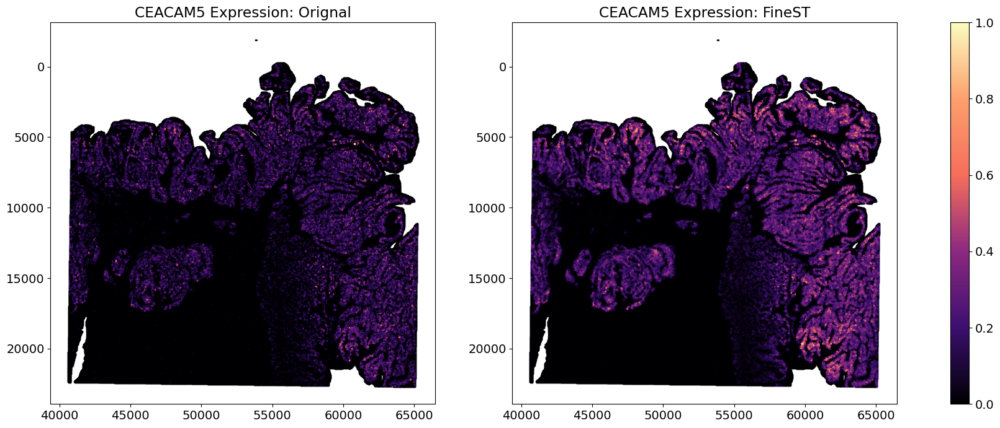

In [104]:
fstplt.gene_expr_compare(adata_8um, "COL1A1", adata_smooth_align.to_df(), gene_hv, 
                      marker='s', s=1, save_path=None) 
fstplt.gene_expr_compare(adata_8um, "SPP1", adata_smooth_align.X, gene_hv, 
                      marker='s', s=1, save_path=None) 
fstplt.gene_expr_compare(adata_8um, "CEACAM5", adata_smooth_align.X, gene_hv, 
                      marker='s', s=1, save_path=None) 

In [106]:
print(adata_smooth)
print(adata_smooth_align)

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


In [118]:
# save adata: 08um infer
patientxy = 'CRC16um'
adata_smooth.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_smooth_8um.h5ad')
adata_smooth_align.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_smooth_align_8um.h5ad')

## 16um: Infer_Impute

3.3 Impute the gene expression of sub-bins

In [108]:
adata_infer_impt, data_infer_impt = fst.weight_adata(adata_infer, adata_smooth, gene_hv, w=0.5)
print(adata_infer_impt)

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


In [109]:
_, data_infer_impt_reshape = fst.reshape_latent_image(data_infer_impt, dataset_class='VisiumHD')
print("data_infer_impt shape:", data_infer_impt.shape)
print("data_infer_impt_reshape shape:", data_infer_impt_reshape.shape)

############################################
## using the weight and add
## adata_infer: inferred results
## sudo_adata: imputed results
############################################
# print(adata.X.A)
# print(adata_infer.X)
# print(adata_smooth.X)

data_infer_impt shape: torch.Size([547816, 862])
data_infer_impt_reshape shape: torch.Size([136954, 862])


3.4 Visualization: selected gene (Visium HD vs. FineST)

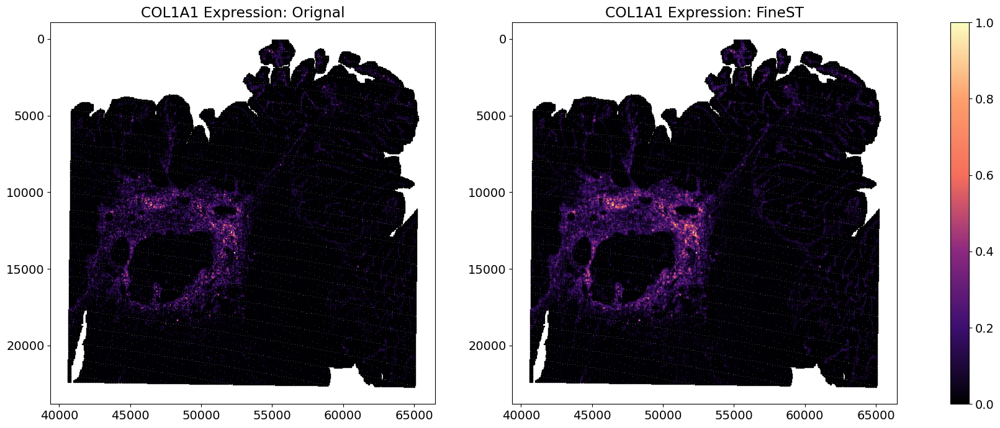

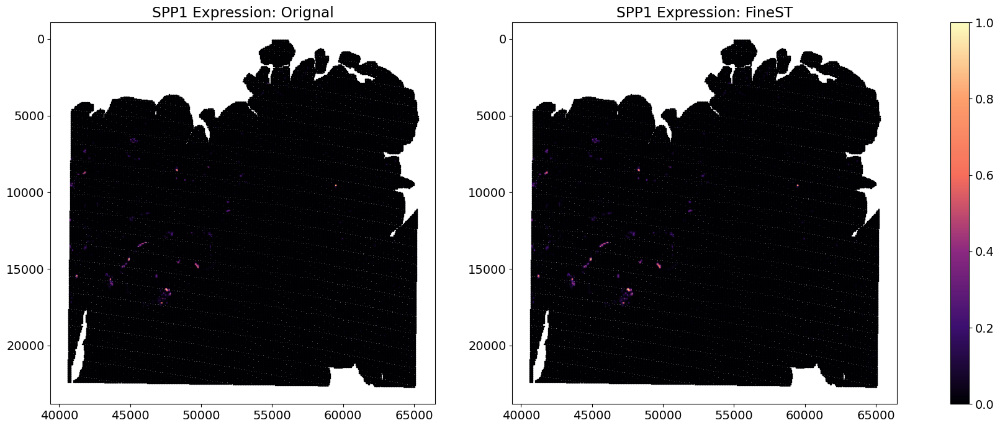

In [110]:
fstplt.gene_expr_compare(adata, "COL1A1", data_infer_impt_reshape, gene_hv, marker='s', s=0.5, save_path=None)
fstplt.gene_expr_compare(adata, "SPP1", data_infer_impt_reshape, gene_hv, marker='s', s=0.5, save_path=None)

3.4 Correlation on 16um: Selected gene、all spots and all genes、mean correlation box

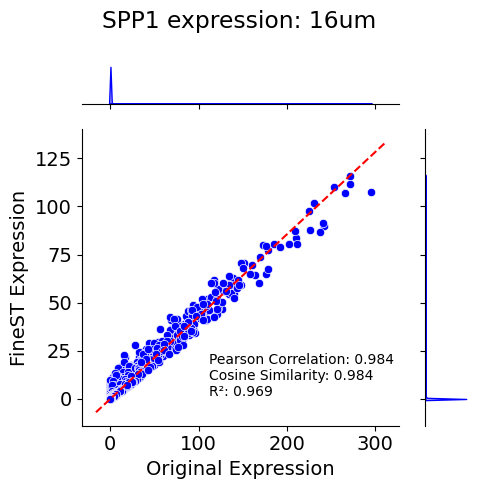

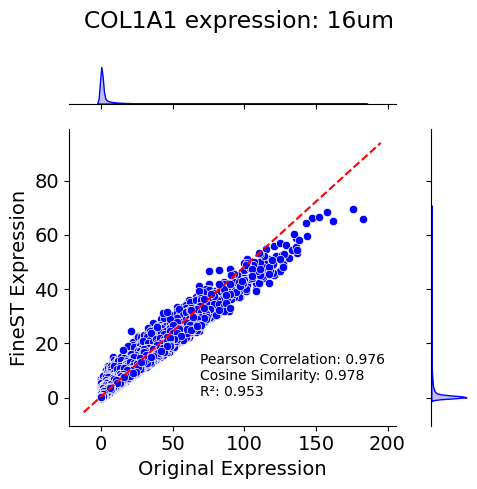

In [114]:
## Noemalized
fstplt.sele_gene_cor(adata, data_infer_impt_reshape, gene_hv, gene = "SPP1",
                     ylabel='FineST Expression', title = "SPP1 expression: 16um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/SPP1_cor_imput_16um.pdf') 
fstplt.sele_gene_cor(adata, data_infer_impt_reshape, gene_hv, gene = "COL1A1",
                     ylabel='FineST Expression', title = "COL1A1 expression: 16um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/COL1A1_cor_imput_16um.pdf') 

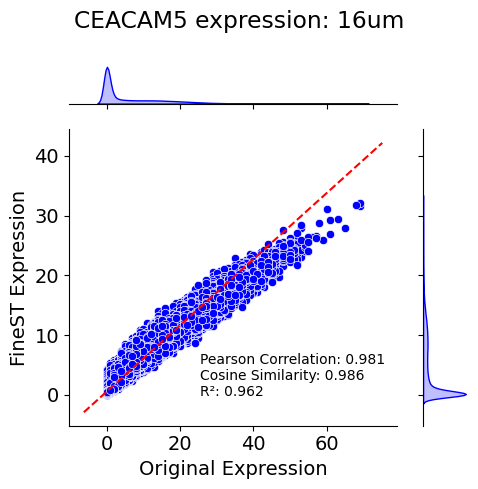

In [115]:
fstplt.sele_gene_cor(adata, data_infer_impt_reshape, gene_hv, gene = "CEACAM5",
                     ylabel='FineST Expression', title = "CEACAM5 expression: 16um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/CEACAM5_cor_imput_16um.pdf') 

In [116]:
logger.info("Running Gene Correlation task...")

(pearson_cor_gene,
 spearman_cor_gene,
 cosine_sim_gene) = fst.mean_cor(adata, data_infer_impt_reshape, 'reconf2', sample="gene")

logger.info("Running Gene Correlation task DINE!")

[2025-02-11 23:18:13] INFO - Running Gene Correlation task...


matrix1:  (136954, 862)
matrix2:  (136954, 862)
Mean Pearson correlation coefficient--reconf2: 0.9572
Mean Spearman correlation coefficient--reconf2: 0.2448


[2025-02-11 23:18:44] INFO - Running Gene Correlation task DINE!


Mean cosine similarity--reconf2: 0.9154


0.9123221677326195
0.957167973102846


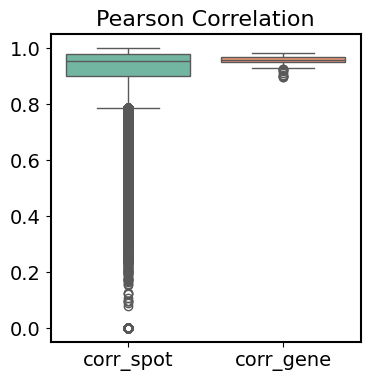

In [109]:
fstplt.mean_cor_box(adata, data_infer_impt_reshape, 
                    save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Boxplot_imput_cor_count_16um.pdf')

In [120]:
adata_df_infer_impt = fst.reshape2adata(adata, data_infer_impt_reshape, gene_hv)
adata_df_infer_impt.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_016um_00000_00000-1,0.006440,0.007836,0.444075,0.004707,0.010670,0.004712,0.004285,0.004954,0.004538,0.004833,...,0.004501,0.004650,0.424018,0.004676,0.004698,0.004651,0.383025,0.005748,0.053099,0.003998
s_016um_00001_00000-1,0.016390,0.012257,0.142959,0.004654,0.012404,0.004805,0.004403,0.005927,0.007929,0.005637,...,0.004536,0.008545,0.087460,0.009481,0.004867,0.004725,0.051157,0.015118,0.364449,0.004032
s_016um_00002_00000-1,0.004598,0.014006,0.027656,0.004447,0.004444,0.004832,0.004293,0.004910,0.004278,0.004818,...,0.003843,0.004508,0.004363,0.004457,0.004586,0.004040,0.007196,0.004161,0.048874,0.003822
s_016um_00003_00000-1,0.004396,0.021296,0.055496,0.004197,0.003890,0.011472,0.004097,0.005241,0.004114,0.005033,...,0.003204,0.004408,0.003936,0.004248,0.004269,0.003347,0.008891,0.003666,0.004225,0.003767
s_016um_00004_00000-1,0.004498,0.012614,0.030001,0.004401,0.004313,0.004830,0.004157,0.004893,0.004125,0.004979,...,0.003551,0.004424,0.004241,0.004357,0.004517,0.003740,0.007572,0.004014,0.004449,0.003748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00298_00418-1,0.003912,0.364288,0.046910,0.003705,0.003244,0.004696,0.003421,0.004799,0.003330,0.004654,...,0.002151,0.003882,0.003238,0.003514,0.003800,0.002214,0.004399,0.002657,0.003643,0.003070
s_016um_00299_00418-1,0.003912,0.061075,0.046910,0.003705,0.003244,0.004696,0.003421,0.004799,0.003330,0.004654,...,0.002151,0.003882,0.003238,0.003514,0.003800,0.002214,0.004399,0.002657,0.003643,0.003070
s_016um_00300_00418-1,0.003912,0.017800,0.046910,0.003705,0.003244,0.050150,0.003421,0.004799,0.003330,0.004654,...,0.002151,0.003882,0.003238,0.003514,0.003800,0.002214,0.004399,0.002657,0.003643,0.003070
s_016um_00301_00418-1,0.004037,0.016640,0.048378,0.003836,0.003423,0.025957,0.003578,0.004820,0.003476,0.004678,...,0.002397,0.003996,0.003416,0.003681,0.003945,0.002451,0.004480,0.002876,0.003759,0.003232


In [121]:
print(adata_df_infer_impt)

AnnData object with n_obs × n_vars = 136954 × 862
    obs: 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'


In [122]:
## save adata: 16um imput
# patientxy = 'CRC16um'
# adata_df_infer_impt.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_impt_16um.h5ad')

## 08um: Infer_Impute

3.5 Correlation on 8um: Selected gene、all spots and all genes、mean correlation box

In [110]:
# ## Load 8um original data from VisiumHD 
# adata_8um = sc.read_h5ad(str(path)+'VisiumHD/Dataset/Colon_Cancer_square_008um.h5ad')
# adata_8um = adata_8um[:, adata.var_names]
# print(adata_8um)

In [111]:
# ## Data preprocess
# adata_8um = fst.adata_preprocess(adata_8um)
# print(adata_8um)

In [112]:
## The predicted 8um data from FineST
adata_infer_impt.obsm['spatial'] = np.stack([adata_infer_impt.obs['x'], adata_infer_impt.obs['y']], -1)
adata_infer_impt.uns['spatial'] = adata_8um.uns['spatial']
print(adata_infer_impt)

AnnData object with n_obs × n_vars = 547816 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


In [113]:
adata_infer_impt_align, _, _ = fst.align_adata_fst2hd(adata_infer_impt, adata_8um)
print(adata_infer_impt_align)

AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'


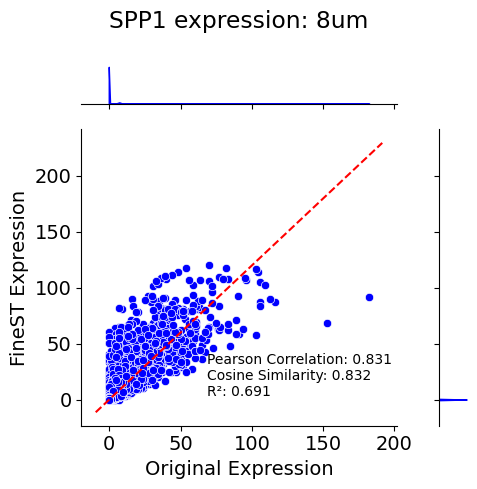

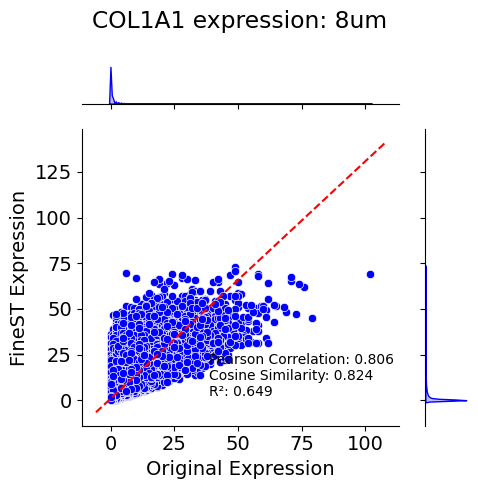

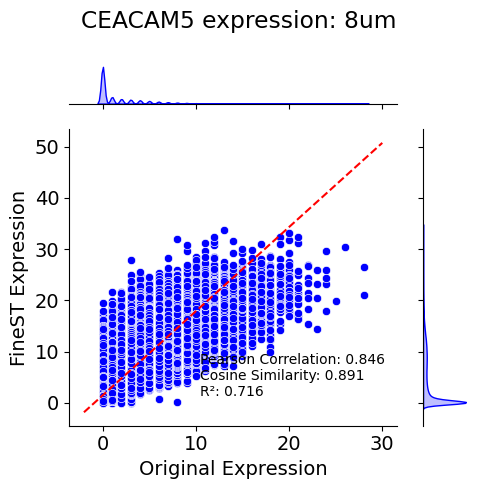

In [115]:
## Noemalized
fstplt.sele_gene_cor(adata_8um, adata_infer_impt_align.to_df(), gene_hv, gene = "SPP1",
                     ylabel='FineST Expression', title = "SPP1 expression: 8um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/SPP1_cor_imput_8um.pdf') 
fstplt.sele_gene_cor(adata_8um, adata_infer_impt_align.to_df(), gene_hv, gene = "COL1A1",
                     ylabel='FineST Expression', title = "COL1A1 expression: 8um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/COL1A1_cor_imput_8um.pdf') 
fstplt.sele_gene_cor(adata_8um, adata_infer_impt_align.to_df(), gene_hv, gene = "CEACAM5",
                     ylabel='FineST Expression', title = "CEACAM5 expression: 8um", size=5,
                     save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/CEACAM5_cor_imput_8um.pdf') 

In [116]:
## Noemalized
logger.info("Running Gene Correlation task...")

(pearson_cor_gene,
 spearman_cor_gene,
 cosine_sim_gene) = fst.mean_cor(adata_8um, adata_infer_impt_align.to_df(), 'reconf2', sample="gene")

logger.info("Running Gene Correlation task DINE!")

[2025-02-10 23:58:30] INFO - Running Gene Correlation task...


matrix1:  (545913, 862)
matrix2:  (545913, 862)
Mean Pearson correlation coefficient--reconf2: 0.5075
Mean Spearman correlation coefficient--reconf2: 0.1299


[2025-02-11 00:01:00] INFO - Running Gene Correlation task DINE!


Mean cosine similarity--reconf2: 0.4936


0.5944144548141796
0.5074928394442862


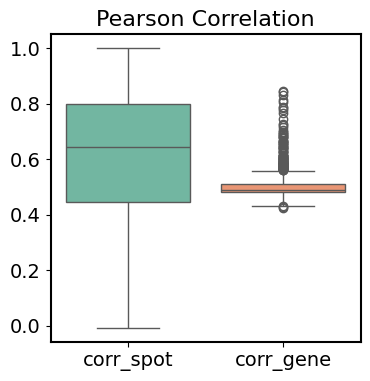

In [120]:
fst.mean_cor_box(adata_8um, np.array(adata_infer_impt_align.to_df()), 
                 save_path=str(path)+'FineST/FineST_local/Dataset/NPC/Figures/Boxplot_imput_cor_count_8um.pdf')

In [121]:
adata_infer_impt_align

AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'

In [122]:
adata_df_infer_impt_align = fst.reshape2adata(adata_8um, adata_infer_impt_align, gene_hv)
adata_df_infer_impt_align.to_df()

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_008um_00301_00321-1,0.004802,0.004537,0.217558,0.004571,0.004962,0.004706,0.004320,0.004939,0.006642,0.029217,...,0.004593,0.028352,0.062449,0.004829,0.004697,0.004764,0.067290,0.067409,0.004916,0.003943
s_008um_00526_00291-1,0.004619,0.063404,1.191899,0.004241,0.003912,0.556604,0.004799,0.013139,0.004475,0.099277,...,0.003884,0.356636,0.004161,0.004514,0.004365,0.003982,0.050424,0.027434,0.004478,0.004787
s_008um_00078_00444-1,0.010093,0.067879,0.111165,0.004728,0.012728,0.004748,0.004459,0.004979,0.004603,0.004911,...,0.004891,0.004765,0.004833,0.004709,0.004949,0.004877,0.092232,0.004809,0.004825,0.004199
s_008um_00128_00278-1,0.014515,0.004951,0.372087,0.004632,0.033368,0.004514,0.003828,0.006902,0.004699,0.004986,...,0.004398,0.004782,0.016587,0.004843,0.004963,0.004836,0.159267,0.014801,0.657198,0.003803
s_008um_00052_00559-1,0.004467,0.004763,0.004520,0.004207,0.121326,0.006001,0.004775,0.004932,0.004807,0.004903,...,0.003320,0.063477,0.004154,0.004155,0.004221,0.003919,0.003843,0.027888,0.340131,0.003727
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1,0.052070,0.166326,0.249074,0.031974,0.022992,0.004935,0.004031,0.013960,0.004905,0.017414,...,0.004957,0.004816,0.013159,0.004921,0.022569,0.004999,0.489206,0.101257,0.061338,0.004182
s_008um_00384_00793-1,0.044233,0.154474,0.899475,0.034433,0.021775,0.027588,0.004289,0.018540,0.082612,0.004765,...,0.004609,0.004897,0.058245,0.021476,0.024202,0.013877,0.174729,0.115537,0.094783,0.004125
s_008um_00565_00244-1,0.062688,0.091441,0.679140,0.071454,0.010673,0.349396,0.003824,0.083608,0.008749,0.015125,...,0.004878,0.004460,0.004930,0.011291,0.356287,0.022660,0.543554,0.183946,0.025445,0.004172
s_008um_00353_00477-1,0.004722,0.072895,0.253414,0.004213,0.003723,0.433698,0.337362,0.014765,0.062452,0.031990,...,0.003918,0.461277,0.003947,0.004517,0.004396,0.004012,0.028294,0.004214,0.004464,0.006897


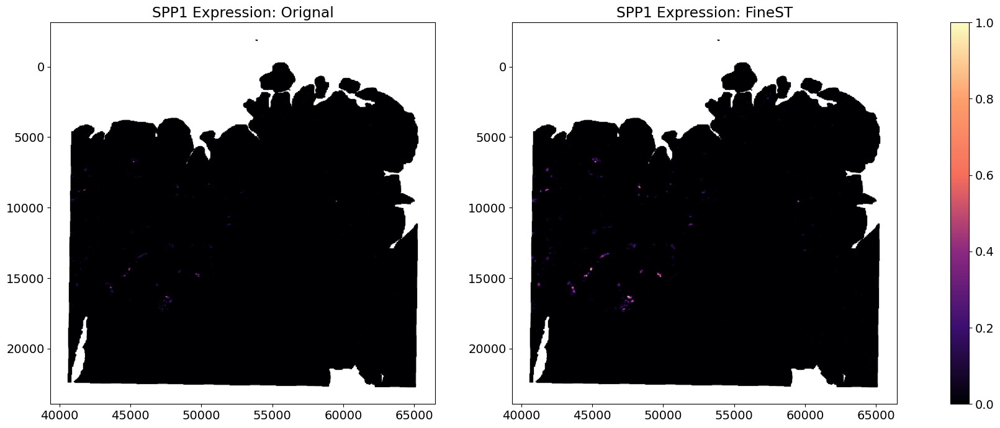

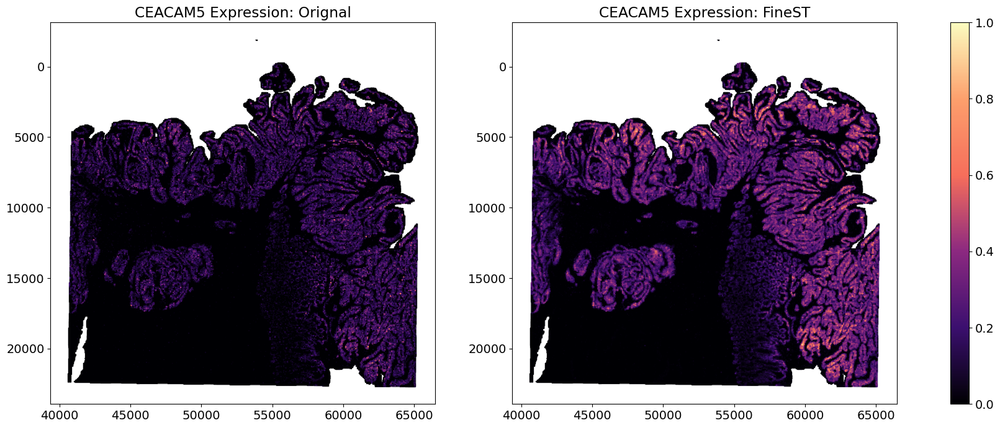

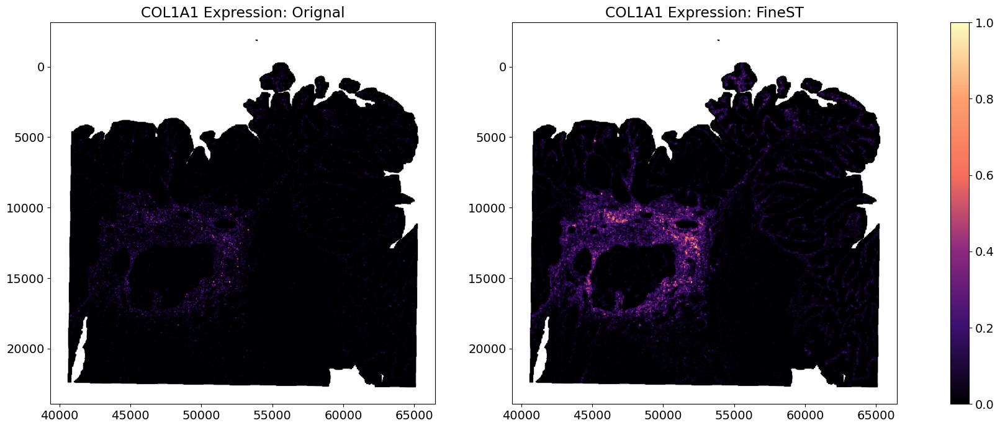

In [123]:
fstplt.gene_expr_compare(adata_8um, "SPP1", adata_infer_impt_align.X, gene_hv, 
                      marker='s', s=0.1, save_path=None) 
fstplt.gene_expr_compare(adata_8um, "CEACAM5", adata_infer_impt_align.X, gene_hv, 
                      marker='s', s=0.1, save_path=None) 
fstplt.gene_expr_compare(adata_8um, "COL1A1", adata_infer_impt_align.X, gene_hv, 
                      marker='s', s=0.1, save_path=None) 

In [126]:
print(adata_8um)
print(adata)
print(adata_infer_impt_align)
print(adata_df_infer_impt_align)
print(data_infer_impt_reshape)

AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 136954 × 862
    obs: 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'x', 'y'
    uns: 'spatial'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 545913 × 862
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'
tensor([[0.0064, 0.0078, 0.4441,  ..., 0.0057, 0.0531, 0.0040],
        [0.0164, 0.0123, 0.1430,  ..., 0.0151, 0.3644, 0.0040],
        [0.0046, 0.0140, 0.0277,  ..., 0.0042, 0.0489, 0.0038],
        ...,
        [0.0039, 0.0178, 0.0469,  ..., 0.0027, 0.0036, 0.0031],
        [0.0040, 0.0166, 0.0484,  ...

In [128]:
# # save adata: 08um infer
patientxy = 'CRC16um'
adata_infer_impt.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_impt_8um.h5ad')
adata_df_infer_impt_align.write_h5ad(str(path)+'FineST/FineST_local/Dataset/ImputData/'+str(patientxy)+'/'+str(patientxy)+'_adata_impt_align_8um.h5ad')

## 4. Hist plot

In [139]:
adata_infer_reshape_df = pd.DataFrame(adata_infer_reshape, index=adata.obs_names, columns=adata.var_names)
adata_infer_reshape_df

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_016um_00000_00000-1,0.012880,0.015672,0.142751,0.009413,0.021341,0.009424,0.008571,0.009908,0.009076,0.009667,...,0.009001,0.009300,0.011698,0.009352,0.009395,0.009302,0.020650,0.011495,0.009608,0.007996
s_016um_00001_00000-1,0.032781,0.024513,0.199372,0.009309,0.024808,0.009610,0.008806,0.011855,0.015858,0.011274,...,0.009072,0.017090,0.046505,0.018961,0.009734,0.009449,0.015768,0.030236,0.033909,0.008064
s_016um_00002_00000-1,0.009196,0.028011,0.055311,0.008895,0.008888,0.009664,0.008585,0.009820,0.008557,0.009636,...,0.007686,0.009016,0.008725,0.008914,0.009172,0.008079,0.014391,0.008322,0.013221,0.007645
s_016um_00003_00000-1,0.008792,0.042593,0.110991,0.008393,0.007780,0.022945,0.008195,0.010483,0.008228,0.010066,...,0.006409,0.008816,0.007873,0.008495,0.008537,0.006693,0.017781,0.007332,0.008450,0.007534
s_016um_00004_00000-1,0.008997,0.025227,0.060002,0.008802,0.008626,0.009660,0.008314,0.009787,0.008250,0.009957,...,0.007102,0.008848,0.008483,0.008713,0.009034,0.007481,0.015144,0.008029,0.008898,0.007497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00298_00418-1,0.007824,0.035599,0.093819,0.007410,0.006489,0.009392,0.006841,0.009598,0.006659,0.009308,...,0.004302,0.007764,0.006476,0.007029,0.007600,0.004428,0.008798,0.005314,0.007286,0.006140
s_016um_00299_00418-1,0.007824,0.035599,0.093819,0.007410,0.006489,0.009392,0.006841,0.009598,0.006659,0.009308,...,0.004302,0.007764,0.006476,0.007029,0.007600,0.004428,0.008798,0.005314,0.007286,0.006140
s_016um_00300_00418-1,0.007824,0.035599,0.093819,0.007410,0.006489,0.009392,0.006841,0.009598,0.006659,0.009308,...,0.004302,0.007764,0.006476,0.007029,0.007600,0.004428,0.008798,0.005314,0.007286,0.006140
s_016um_00301_00418-1,0.008074,0.033280,0.096757,0.007671,0.006846,0.009510,0.007155,0.009640,0.006953,0.009357,...,0.004794,0.007992,0.006832,0.007363,0.007891,0.004901,0.008960,0.005753,0.007519,0.006464


0.16833441690648918


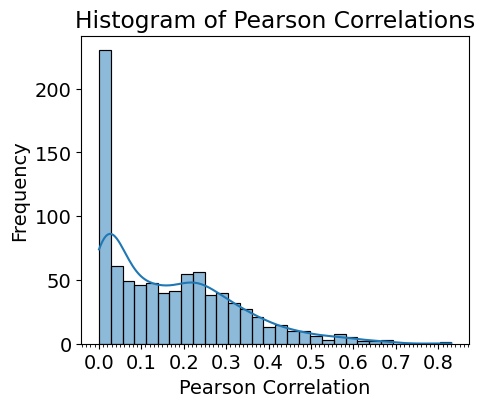

In [140]:
fstplt.cor_hist(adata, adata_infer_reshape_df, 
                 fig_size=(5, 4), trans=False, format='svg', 
                 save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Hist_infer_cor_count_FineST_16um.svg')

0.08509824623214067


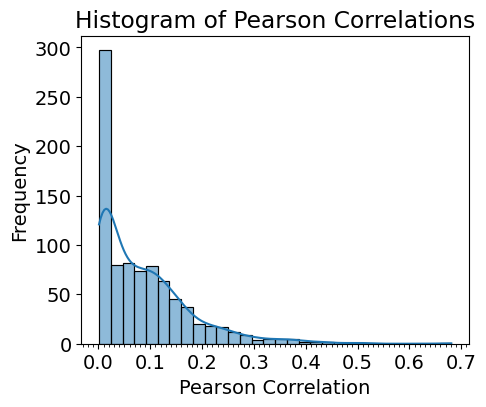

In [141]:
fstplt.cor_hist(adata_8um, adata_infer_align.to_df(), 
                 fig_size=(5, 4), trans=False, format='svg', 
                 save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Hist_infer_cor_count_FineST_8um.svg')

In [142]:
data_infer_impt_reshape_df = pd.DataFrame(data_infer_impt_reshape, index=adata.obs_names, columns=adata.var_names)
data_infer_impt_reshape_df

,TGFB1,TGFBR1,TGFBR2,TGFB2,TGFB3,ACVR1B,ACVR1C,ACVR1,BMP2,BMPR1A,...,TREM2,SEMA6A,SEMA6B,SEMA7A,PLXNC1,SIGLEC1,THY1,VCAM1,VSIR,IGSF11
s_016um_00000_00000-1,0.006440,0.007836,0.444075,0.004707,0.010670,0.004712,0.004285,0.004954,0.004538,0.004833,...,0.004501,0.004650,0.424018,0.004676,0.004698,0.004651,0.383025,0.005748,0.053099,0.003998
s_016um_00001_00000-1,0.016390,0.012257,0.142959,0.004654,0.012404,0.004805,0.004403,0.005927,0.007929,0.005637,...,0.004536,0.008545,0.087460,0.009481,0.004867,0.004725,0.051157,0.015118,0.364449,0.004032
s_016um_00002_00000-1,0.004598,0.014006,0.027656,0.004447,0.004444,0.004832,0.004293,0.004910,0.004278,0.004818,...,0.003843,0.004508,0.004363,0.004457,0.004586,0.004040,0.007196,0.004161,0.048874,0.003822
s_016um_00003_00000-1,0.004396,0.021296,0.055496,0.004197,0.003890,0.011472,0.004097,0.005241,0.004114,0.005033,...,0.003204,0.004408,0.003936,0.004248,0.004269,0.003347,0.008891,0.003666,0.004225,0.003767
s_016um_00004_00000-1,0.004498,0.012614,0.030001,0.004401,0.004313,0.004830,0.004157,0.004893,0.004125,0.004979,...,0.003551,0.004424,0.004241,0.004357,0.004517,0.003740,0.007572,0.004014,0.004449,0.003748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_016um_00298_00418-1,0.003912,0.364288,0.046910,0.003705,0.003244,0.004696,0.003421,0.004799,0.003330,0.004654,...,0.002151,0.003882,0.003238,0.003514,0.003800,0.002214,0.004399,0.002657,0.003643,0.003070
s_016um_00299_00418-1,0.003912,0.061075,0.046910,0.003705,0.003244,0.004696,0.003421,0.004799,0.003330,0.004654,...,0.002151,0.003882,0.003238,0.003514,0.003800,0.002214,0.004399,0.002657,0.003643,0.003070
s_016um_00300_00418-1,0.003912,0.017800,0.046910,0.003705,0.003244,0.050150,0.003421,0.004799,0.003330,0.004654,...,0.002151,0.003882,0.003238,0.003514,0.003800,0.002214,0.004399,0.002657,0.003643,0.003070
s_016um_00301_00418-1,0.004037,0.016640,0.048378,0.003836,0.003423,0.025957,0.003578,0.004820,0.003476,0.004678,...,0.002397,0.003996,0.003416,0.003681,0.003945,0.002451,0.004480,0.002876,0.003759,0.003232


0.9571679731028461


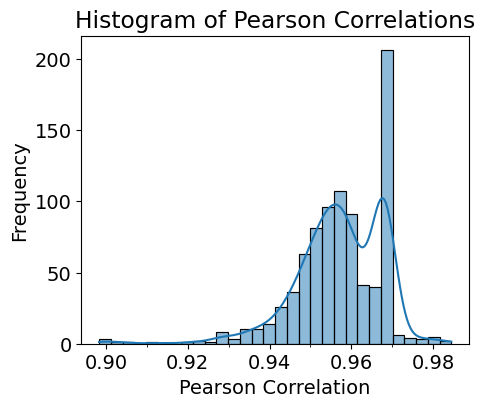

In [143]:
fstplt.cor_hist(adata, data_infer_impt_reshape_df, max_step=0.02, min_step=0.01,
                 fig_size=(5, 4), trans=False, format='svg', 
                 save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Hist_imput_cor_count_FineST_16um.svg')

0.5074928394442864


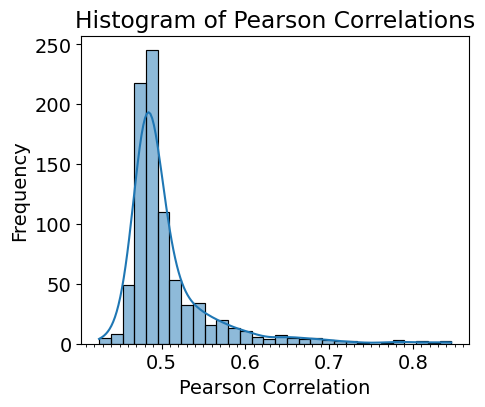

In [144]:
fstplt.cor_hist(adata_8um, adata_infer_impt_align.to_df(), 
                 fig_size=(5, 4), trans=False, format='svg', 
                 save_path=str(path)+'FineST/FineST_local/Dataset/CRC16um/Figures/Hist_imput_cor_count_FineST_8um.svg')